<a href="https://colab.research.google.com/github/g-roger/deslocamentos-e-geo/blob/master/1_0_GeoPandas_v1_2_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Intodução ao GeoPandas**

In [1]:
# Instalando o pyodbc e geopandas no Google Colab, para ambientes locais basta o comando pip install pyodbc e pip install geopandas
!apt install unixodbc-dev
!pip install pyodbc
!pip install geopandas
!pip install shapely
!pip install contextily

Reading package lists... Done
Building dependency tree       
Reading state information... Done
unixodbc-dev is already the newest version (2.3.7).
0 upgraded, 0 newly installed, 0 to remove and 76 not upgraded.


In [2]:
#Instala driver do SQL SERVER para Ubuntu diretamente do site da Microsoft
%%sh
curl https://packages.microsoft.com/keys/microsoft.asc | apt-key add -
curl https://packages.microsoft.com/config/ubuntu/16.04/prod.list > /etc/apt/sources.list.d/mssql-release.list
sudo apt-get update
sudo ACCEPT_EULA=Y apt-get -q -y install msodbcsql17

OK
Hit:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:3 https://packages.microsoft.com/ubuntu/16.04/prod xenial InRelease
Ign:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:7 http://security.ubuntu.com/ubuntu bionic-security InRelease
Hit:8 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:9 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:10 http://archive.ubuntu.com/ubuntu bionic-updates InRelease
Hit:12 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:13 http://archive.ubuntu.com/ubuntu bionic-backports InRelease
Hit:15 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic I

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0Warning: apt-key output should not be parsed (stdout is not a terminal)
100   983  100   983    0     0   5649      0 --:--:-- --:--:-- --:--:--  5649
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    79  100    79    0     0    738      0 --:--:-- --:--:-- --:--:--   738


In [3]:
import pyodbc 
import pandas as pd
import geopandas
import matplotlib.pyplot as plt
from shapely.wkt import loads
import contextily

In [4]:
print(pyodbc.drivers())

['ODBC Driver 17 for SQL Server']


Conectando ao banco de dados

In [5]:
servidor = 'geoserverbtc.database.windows.net'
bancodedados = 'geoserverdb'
usuario = 'geoadmin'
password = 'localizacao@123'
try:
    conexao = pyodbc.connect('DRIVER={ODBC Driver 17 for SQL Server};SERVER=' + 
                              servidor+';DATABASE='+bancodedados+';UID='+usuario+';PWD=' + password)
    print("\n"*2)
    print("Conectado com sucesso")
    
except Exception as e:
    print("Erro ao conectar ao SQL Server: ", e)




Conectado com sucesso


Realizando a leitura da Tabela Cidade do Banco de Dados GeoFiap para seus respectivos Dataframes Pandas

In [6]:
sql = "Select Nome, CidadeGeo.STAsText() as WKTGeoCidade from Cidades "
dfCidades = pd.read_sql(sql,conexao)
dfCidades.head()

,Nome,WKTGeoCidade
0,São Paulo,"POLYGON ((-46.8233162 -23.4223871, -46.8222971..."
1,Mauá,POLYGON ((-46.394868999999915 -23.612356999999...
2,Itapecerica Da Serra,POLYGON ((-46.863780766999923 -23.804685555999...
3,Cajamar,POLYGON ((-46.830908027999953 -23.430019569999...
4,Itaquaquecetuba,POLYGON ((-46.298416242999906 -23.496306748999...


In [7]:
dfCidades.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Nome          25 non-null     object
 1   WKTGeoCidade  25 non-null     object
dtypes: object(2)
memory usage: 528.0+ bytes


In [8]:
#Obtém o WKT da cidades
dfCidades["GeoCidadeGeom"] = dfCidades["WKTGeoCidade"].apply(loads)
dfCidades.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Nome           25 non-null     object
 1   WKTGeoCidade   25 non-null     object
 2   GeoCidadeGeom  25 non-null     object
dtypes: object(3)
memory usage: 728.0+ bytes


In [9]:
#cria o GeoDataFrame
geoCidades = geopandas.GeoDataFrame(dfCidades, geometry='GeoCidadeGeom', crs= 'EPSG:4326' )
geoCidades.head()

,Nome,WKTGeoCidade,GeoCidadeGeom
0,São Paulo,"POLYGON ((-46.8233162 -23.4223871, -46.8222971...","POLYGON ((-46.82332 -23.42239, -46.82230 -23.4..."
1,Mauá,POLYGON ((-46.394868999999915 -23.612356999999...,"POLYGON ((-46.39487 -23.61236, -46.39479 -23.6..."
2,Itapecerica Da Serra,POLYGON ((-46.863780766999923 -23.804685555999...,"POLYGON ((-46.86378 -23.80469, -46.86352 -23.8..."
3,Cajamar,POLYGON ((-46.830908027999953 -23.430019569999...,"POLYGON ((-46.83091 -23.43002, -46.83053 -23.4..."
4,Itaquaquecetuba,POLYGON ((-46.298416242999906 -23.496306748999...,"POLYGON ((-46.29842 -23.49631, -46.29811 -23.4..."


In [10]:
dfCidades.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Nome           25 non-null     object  
 1   WKTGeoCidade   25 non-null     object  
 2   GeoCidadeGeom  25 non-null     geometry
dtypes: geometry(1), object(2)
memory usage: 728.0+ bytes


In [11]:
print(geoCidades.crs)

EPSG:4326


Realizando a Plotagem das Cidades

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  after removing the cwd from sys.path.


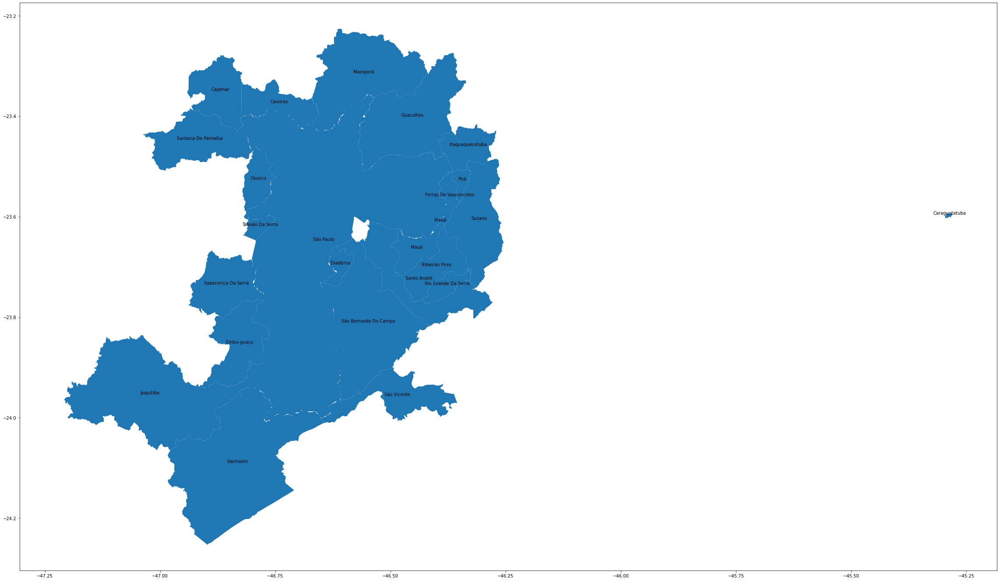

In [12]:
#Faz a plotagem do GeoDataFrame
ax = geoCidades.plot(figsize=(40, 40) ) 

for centroid, label in zip(geoCidades.geometry.centroid , geoCidades.Nome):    
    ax.annotate(label, xy=centroid.coords[0], xytext=(3, 3), textcoords="offset points",  ha='center')

## Exercício 1 - Geopandas
### Faça uma consulta na tabela Checkin e faça a plotagem dos pontos assim como feito na tabela Cidades, Exibindo o IDCheckin de cada ponto:

Coloque o código da Consulta:

In [13]:
sql = "select IDCheckin, PontoGeo.STAsText() as WKTGeoCheckin from Checkin "
dfCheckin = pd.read_sql(sql, conexao)
dfCheckin.head()

,IDCheckin,WKTGeoCheckin
0,2,POINT (-46.536415314446785 -23.655191690939045)
1,3,POINT (-46.536323311478263 -23.655185405021943)
2,100,POINT (-46.5544114828187 -23.696191810549713)
3,2010,POINT (-46.6523648052197 -23.564109701563236)
4,2100,POINT (-46.656482085284722 -23.566722590835262)


In [14]:
dfCheckin["GeoCheckin"] = dfCheckin["WKTGeoCheckin"].apply(loads)


Coloque aqui o código da conversão do WKT e criação do GeoPandas Dataframe, Dê o nome de geoCheckin ao objeto:

In [15]:
geoCheckin = geopandas.GeoDataFrame(dfCheckin, geometry='GeoCheckin', crs= 'EPSG:4326' )
geoCheckin

,IDCheckin,WKTGeoCheckin,GeoCheckin
0,2,POINT (-46.536415314446785 -23.655191690939045),POINT (-46.53642 -23.65519)
1,3,POINT (-46.536323311478263 -23.655185405021943),POINT (-46.53632 -23.65519)
2,100,POINT (-46.5544114828187 -23.696191810549713),POINT (-46.55441 -23.69619)
3,2010,POINT (-46.6523648052197 -23.564109701563236),POINT (-46.65236 -23.56411)
4,2100,POINT (-46.656482085284722 -23.566722590835262),POINT (-46.65648 -23.56672)
...,...,...,...
105,82449564,POINT (-46.618532822946094 -23.644908258356949),POINT (-46.61853 -23.64491)
106,338896001,POINT (-46.778602467244035 -23.5083797812762),POINT (-46.77860 -23.50838)
107,338896002,POINT (-46.76217690062316 -23.52910123230113),POINT (-46.76218 -23.52910)
108,340400123,POINT (-46.746129587155991 -23.628865293250328),POINT (-46.74613 -23.62887)


 Coloque aqui a plotagem dos pontos:

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  after removing the cwd from sys.path.


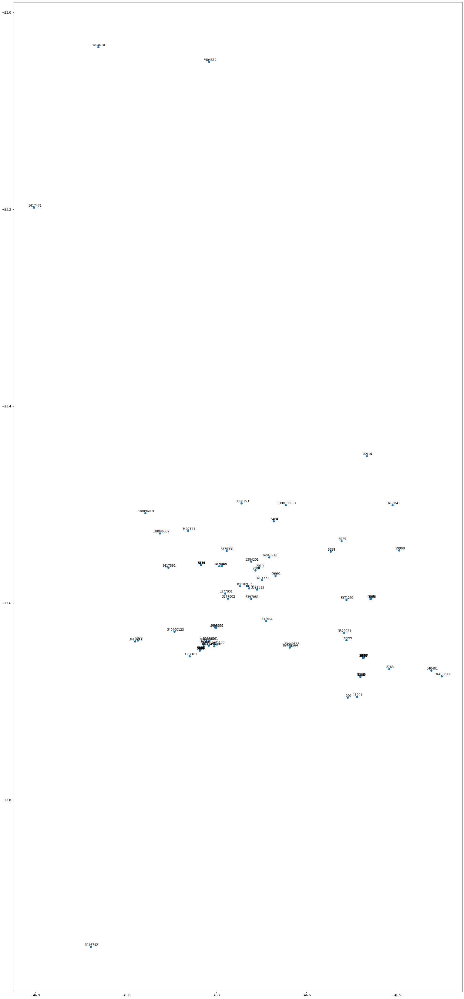

In [16]:
#Faz a plotagem do GeoDataFrame
ax = geoCheckin.plot(figsize=(60, 60) ) 

for centroid, label in zip(geoCheckin.geometry.centroid , geoCheckin.IDCheckin):    
    ax.annotate(label, xy=centroid.coords[0], xytext=(3, 3), textcoords="offset points",  ha='center')

## Plotando as Cidades e os Checkin ao mesmo tempo:

In [17]:
geoCheckin = geoCheckin.to_crs(epsg=3857)
geoCidades = geoCidades.to_crs(epsg=3857)

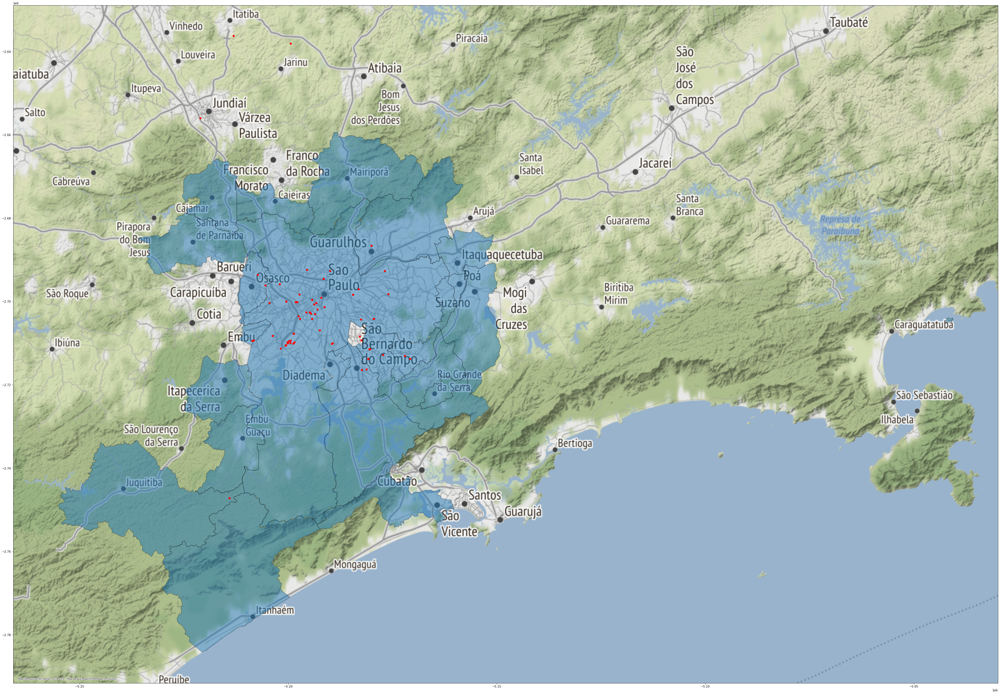

In [18]:
ax = geoCidades.plot(figsize=(60, 60), edgecolor='black', alpha= 0.5)
ax = geoCheckin.plot(ax=ax , color = 'red')
contextily.add_basemap(ax)
plt.show()


## Exercício 2 - Clusterizando dados de Latitude e Longitude

Faça a clusterização dos dados da tabela Checkin (utilizando apenas as colunas Latitude e Longitude do tipo geometry) utilizando Agglomerative Clustering, Kmeans, DBScan ou SOM. Faça o plot dos pontos da tabela checkin colocando cada cluster em uma cor distinta:

In [19]:
#obtendo a Latitude e Longitude do pontos de um GeoPandas Dataframe
#print(geoCheckin.IDCheckin[0], geoCheckin.geometry[0].x, geoCheckin.geometry[0].y)